# Opendata meteofrance

## Présentation des données

Données climatologiques de toutes les stations de métropole et d'outre-mer depuis leur ouverture, pour tous les paramètres disponibles. Ces données ont subi un contrôle climatologique.

### Informations techniques

Les données quotidiennes sont proposées en téléchargement, par département, et par lots de période au format csv compressé.

L'ensemble des paramètres est fourni pour l'ensemble des stations météorologiques.

La mise à jour des fichiers est annuelle pour les historiques avant 1950, mensuelle pour les fichiers de 1950 jusqu'à l'année 2021 et quotidiennes pour les deux dernières années

Sources:

* https://meteo.data.gouv.fr/datasets/6569b51ae64326786e4e8e1a

Data:

* [QUOT_departement_33_periode_1842-1949_RR-T-Vent](https://www.data.gouv.fr/fr/datasets/r/bd7854d9-548b-4b3c-bbaa-8586a7060dba)
* [QUOT_departement_33_periode_1950-2021_RR-T-Vent](https://www.data.gouv.fr/fr/datasets/r/b0e78f3d-9085-4d6d-a47d-6d942f5e9a54)
* [QUOT_departement_33_periode_2023-2024_RR-T-Vent](https://www.data.gouv.fr/fr/datasets/r/5f196a76-ba4f-4aa7-af28-eff6c8797b50)


### Q_descriptif_champs_RR-T-Vent.csv

```
NUM_POSTE   : numéro Météo-France du poste sur 8 chiffres
NOM_USUEL   : nom usuel du poste
LAT         : latitude, négative au sud (en degrés et millionièmes de degré)
LON         : longitude, négative à l’ouest de GREENWICH (en degrés et millionièmes de degré)
ALTI        : altitude du pied de l'abri ou du pluviomètre si pas d'abri (en m)
AAAAMMJJ    : date de la mesure (année mois jour)
RR          : quantité de précipitation tombée en 24 heures (de 06h FU le jour J à 06h FU le jour J+1). La valeur relevée à J+1 est affectée au jour J (en mm et 1/10)
TN          : température minimale sous abri (en °C et 1/10)
HTN         : heure de TN (hhmm)
TX          : température maximale sous abri (en °C et 1/10)
HTX         : heure de TX (hhmm)
TM          : moyenne quotidienne des températures horaires sous abri (en °C et 1/10)
TNTXM       : moyenne quotidienne (TN+TX)/2 (en °C et 1/10)
TAMPLI      : amplitude thermique quotidienne : écart entre TX et TN quotidiens (TX-TN) (en °C et 1/10)
TNSOL       : température quotidienne minimale à 10 cm au-dessus du sol (en °C et 1/10)
TN50        : température quotidienne minimale à 50 cm au-dessus du sol (en °C et 1/10)
DG          : durée de gel sous abri (T ≤ 0°C) (en mn)
FFM         : moyenne quotidienne de la force du vent moyenné sur 10 mn, à 10 m (en m/s et 1/10)
FF2M        : moyenne quotidienne de la force du vent moyenné sur 10 mn, à 2 m (en m/s et 1/10)
FXY         : maximum quotidien de la force maximale horaire du vent moyenné sur 10 mn, à 10 m (en m/s et 1/10)
DXY         : direction de FXY (en rose de 360)
HXY         : heure de FXY (hhmm)
FXI         : maximum quotidien de la force maximale horaire du vent instantané, à 10 m (en m/s et 1/10)
DXI         : direction de FXI (en rose de 360)
HXI         : heure de FXI (hhmm)
FXI2        : maximum quotidien de la force maximale horaire du vent instantané, à 2 m (en m/s et 1/10)
DXI2        : direction de FXI2 (en rose de 360)
HXI2        : heure de FXI2 (hhmm)
FXI3S       : maximum quotidien de la force maximale horaire du vent moyenné sur 3 s, à 10 m (en m/s et 1/10)
DXI3S       : direction de FXI3S (en rose de 360)
HXI3S       : heure de FXI3S (hhmm)

A chaque donnée est associé un code qualité (ex: T;QT) :
 9 : donnée filtrée (la donnée a passé les filtres/contrôles de premiers niveaux)
 0 : donnée protégée (la donnée a été validée définitivement par le climatologue)
 1 : donnée validée (la donnée a été validée par contrôle automatique ou par le climatologue)
 2 : donnée douteuse en cours de vérification (la donnée a été mise en doute par contrôle automatique)
 
```

## Calcul du nombre de jours "situation inhabituelle" pour le SIBA



```
Les notions de « fortes pluies » et d’ « inondation » manquant de précision et pouvant être sujettes à interprétation, il avait été proposé fin 2016, après une analyse statistique des situations rencontrées lors des différents épisodes pluvieux enregistrés de 2013 à 2016, que soit déclaré au niveau du Bassin d’Arcachon « situation inhabituelle » lorsque les précipitations cumulées sur 7 jours consécutifs dépassent 70 mm. 
```

[Source plainte adeba contre le siba](https://adeba.fr/index.php/2023/12/31/plainte-contre-le-siba-pour-pollution-des-eaux-du-bassin/)


## Objectif

Le but de cette feuille de calcul est de vérifier le caractère inhabituel de 70mm de précipitations cumulées sur 7 jours consécutifs.

In [94]:
import glob
import os

import pandas as pd

q_33_csv = glob.glob(os.path.join("data", "Q_33_*.csv"))

q_33_csv                   

['data/Q_33_1842-1949_RR-T-Vent.csv',
 'data/Q_33_latest-2023-2024_RR-T-Vent.csv',
 'data/Q_33_previous-1950-2021_RR-T-Vent.csv']

In [95]:
df = pd.concat((pd.read_csv(f, delimiter=";") for f in q_33_csv), ignore_index=True)

## Précipitations sur les 7 derniers jours

La somme sur les 7 derniers jours des précipitations sur les villes du Bassin d'Arcachon (Arcachon, Audenge, Arès, Cap-ferret).

In [96]:
from IPython.display import display
df['DATE'] = pd.to_datetime(df['AAAAMMJJ'], format='%Y%m%d')
df['YEAR'] = df['DATE'].dt.year
df_sorted = df[df['NOM_USUEL'].isin(["ARCACHON", "AUDENGE AGGLOMERATION", "ARES", "CAP-FERRET"])].sort_values(by=['NOM_USUEL', 'DATE'])

df_sorted['SLIDING_RR7'] = df_sorted.groupby('NOM_USUEL')['RR'].rolling(window=7, min_periods=1).sum().reset_index(0, drop=True)
df_sorted['SLIDING_RR30'] = df_sorted.groupby('NOM_USUEL')['RR'].rolling(window=30, min_periods=1).sum().reset_index(0, drop=True)
df_sorted['SLIDING_RR60'] = df_sorted.groupby('NOM_USUEL')['RR'].rolling(window=60, min_periods=1).sum().reset_index(0, drop=True)

df_sorted.describe()



,NUM_POSTE,LAT,LON,ALTI,AAAAMMJJ,RR,QRR,TN,QTN,HTN,...,DXI3S,QDXI3S,HXI3S,QHXI3S,QFXI2,DATE,YEAR,SLIDING_RR7,SLIDING_RR30,SLIDING_RR60
count,9.353600e+04,93536.000000,93536.000000,93536.000000,9.353600e+04,93094.000000,93095.000000,60684.000000,60684.000000,19729.000000,...,0.0,27.0,4634.000000,4661.000000,0.0,93536,93536.000000,93152.000000,93258.000000,93350.000000
mean,3.309351e+07,44.687795,-1.169036,5.006928,1.955791e+07,2.354111,1.257887,9.871861,3.382572,745.640681,...,NaN,1.0,1230.307078,8.927912,NaN,1956-03-22 07:40:10.571330816,1955.724074,16.465258,70.450204,140.647785
min,3.300900e+07,44.630667,-1.252000,2.000000,1.882010e+07,0.000000,1.000000,-13.800000,1.000000,0.000000,...,NaN,1.0,0.000000,1.000000,NaN,1882-01-01 00:00:00,1882.000000,0.000000,0.000000,0.000000
25%,3.301100e+07,44.630667,-1.252000,2.000000,1.926022e+07,0.000000,1.000000,6.000000,1.000000,412.000000,...,NaN,1.0,536.000000,9.000000,NaN,1926-02-21 00:00:00,1926.000000,2.000000,35.000000,87.700000
50%,3.301100e+07,44.663333,-1.150000,4.000000,1.965091e+07,0.000000,1.000000,10.000000,1.000000,534.000000,...,NaN,1.0,1410.000000,9.000000,NaN,1965-09-08 12:00:00,1965.000000,10.000000,61.000000,127.800000
75%,3.323600e+07,44.770000,-1.135000,8.000000,1.987122e+07,2.300000,1.000000,14.400000,9.000000,745.000000,...,NaN,1.0,1758.750000,9.000000,NaN,1987-12-19 00:00:00,1987.000000,24.000000,95.700000,179.500000
max,3.323600e+07,44.770000,-1.013333,8.000000,2.024010e+07,121.100000,9.000000,25.300000,9.000000,2359.000000,...,NaN,1.0,2359.000000,9.000000,NaN,2024-01-02 00:00:00,2024.000000,176.000000,408.100000,614.000000
std,1.080925e+05,0.059284,0.073023,2.552615,3.911517e+05,5.076927,1.413015,5.698320,3.658435,609.150578,...,NaN,0.0,740.888733,0.756060,NaN,NaN,39.115189,19.137067,47.803669,74.339386


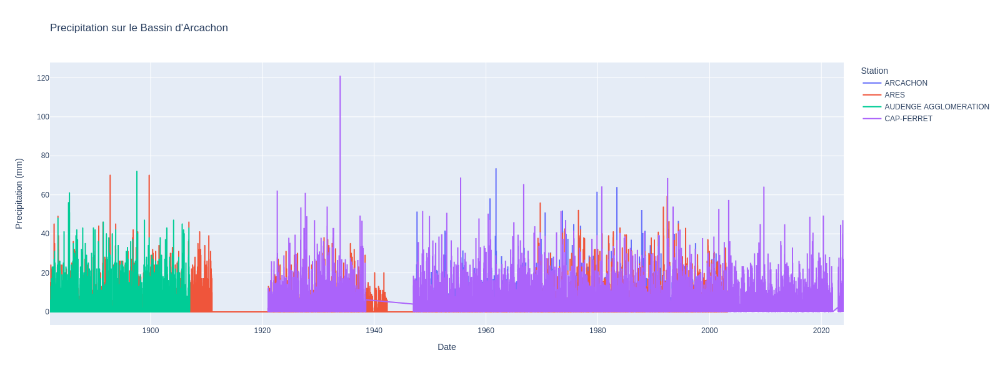

In [113]:
from IPython.display import Image
import plotly.express as px
import plotly.io as pio

fig = px.line(df_sorted, x='DATE', y='RR', color='NOM_USUEL', title='Precipitation sur le Bassin d\'Arcachon')
fig.update_layout(xaxis_title='Date', yaxis_title='Precipitation (mm)', legend_title='Station')
fig.show()

pio.write_image(fig, 'results/precipitation_ba.png', width=1600, height=600)

Image(filename='results/precipitation_ba.png')


### Commentaire sur les données

Les séries temporelles de Météo-France autour du bassin d’Arcachon ne sont pas complètes sur les 141 ans de l'intervalle (1882-2023), cependant grâce aux 4 stations (Arcachon, Ares, Audenge, Cap-Ferret) il est possible de vérifier la coherence des données et leur relative homogénéité.

Pour la suite de l'étude nous concentrerons notre attention sur la station du Cap-Ferret car elle offre la série la plus complète sur le dernier siècle.

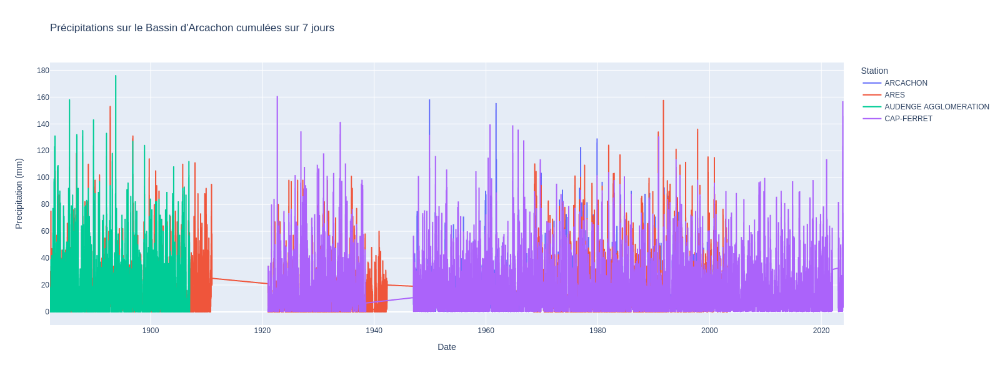

In [116]:
fig = px.line(df_sorted, x='DATE', y='SLIDING_RR7', color='NOM_USUEL', title='Précipitations sur le Bassin d\'Arcachon cumulées sur 7 jours')
fig.update_layout(xaxis_title='Date', yaxis_title='Precipitation (mm)', legend_title='Station')
fig.show()

pio.write_image(fig, 'results/precipitation_RR7_ba.png', width=1600, height=600)
Image(filename='results/precipitation_RR7_ba.png')

La figure précédente montre que les précipitations cumulées sur 7 jours en 2023 ont déjà été atteintes 6 fois depuis 1882.

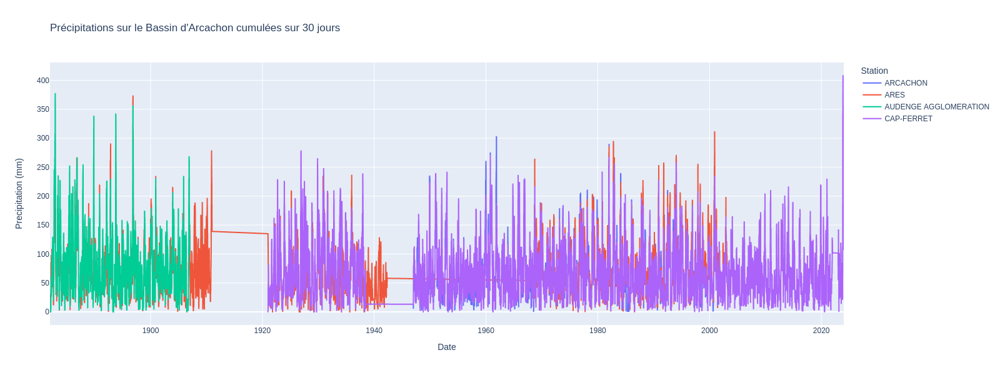

In [114]:
fig = px.line(df_sorted, x='DATE', y='SLIDING_RR30', color='NOM_USUEL', title='Précipitations sur le Bassin d\'Arcachon cumulées sur 30 jours')
fig.update_layout(xaxis_title='Date', yaxis_title='Precipitation (mm)', legend_title='Station')
fig.show()

pio.write_image(fig, 'results/precipitation_RR30_ba.png', width=1600, height=600)
Image(filename='results/precipitation_RR30_ba.png')

Le mois de novembre 2023 montre une précipitation cumulée sur 30 jours glissant qui établit un nouveau record depuis 1882.

### Vérification des données 

Vérification manuelle des données pour le `CAP-FERRET` en 2023.

#### Filtrage des données

Filtrage des données pour compter le nombre **d’événements inhabituels** par année.

In [100]:
df_filtered_cap_ferret_2023 = df_sorted[(df_sorted['NOM_USUEL'] == "CAP-FERRET") & (df_sorted['YEAR'] == 2023)][['DATE','RR', 'SLIDING_RR7']]

def highlight(row):
    if row['SLIDING_RR7'] >= 70:
        return ['background-color: yellow; color: #00008B'] * len(row)
    else:
        return [''] * len(row)

display(df_filtered_cap_ferret_2023.style.apply(highlight, axis=1))


,DATE,RR,SLIDING_RR7
715142,2023-01-01 00:00:00,2.400000,32.600000
715143,2023-01-02 00:00:00,0.000000,23.100000
715144,2023-01-03 00:00:00,0.200000,15.900000
715145,2023-01-04 00:00:00,0.000000,3.200000
715146,2023-01-05 00:00:00,0.000000,2.800000
715147,2023-01-06 00:00:00,0.000000,2.600000
715148,2023-01-07 00:00:00,16.300000,18.900000
715149,2023-01-08 00:00:00,3.400000,19.900000
715150,2023-01-09 00:00:00,0.400000,20.300000
715151,2023-01-10 00:00:00,1.400000,21.500000


### Nombre d'événements inhabituels par an et par station

Le but est de comprendre si 70 mm de précipitations cumulées sur 7 jours est inhabituel ou régulier. En orange clair les années ou le nombre d’événements inhabituels est supérieur à 10 fois par an.

In [101]:

df_filtered = df_sorted[df_sorted['SLIDING_RR7'] > 70]
days_count = df_filtered.groupby(['NOM_USUEL', 'YEAR']).size().reset_index(name='COUNT')

def highlight(row):
    if row['COUNT'] >= 10:
        return ['background-color: #FFDAB9; color: #00008B'] * len(row)
    else:
        return [''] * len(row)

display(days_count.style.apply(highlight, axis=1))


,NOM_USUEL,YEAR,COUNT
0,ARCACHON,1947,10
1,ARCACHON,1949,10
2,ARCACHON,1950,7
3,ARCACHON,1952,6
4,ARCACHON,1955,3
5,ARCACHON,1958,9
6,ARCACHON,1959,13
7,ARCACHON,1960,22
8,ARCACHON,1961,17
9,ARCACHON,1964,8


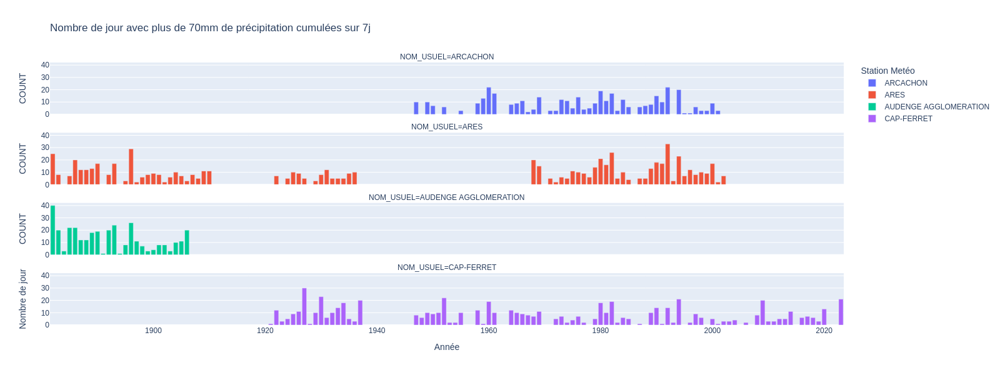

In [115]:
fig = px.bar(days_count, x='YEAR', y='COUNT', color='NOM_USUEL', facet_col='NOM_USUEL', facet_col_wrap=1, title='Nombre de jour avec plus de 70mm de précipitation cumulées sur 7j')
fig.update_layout(xaxis_title='Année', yaxis_title='Nombre de jour', legend_title='Station Metéo')
fig.update_layout(width=1200, height=1000)  # Set the width to full and increase the height
fig.show()
pio.write_image(fig, 'results/nb_days_plus_de70mm_par_7j_ba.png', width=1600, height=600)
Image(filename='results/nb_days_plus_de70mm_par_7j_ba.png')


## Conclusion

Le graphique ci dessus montre que la définition `évenement inhabituel` retenue par le SIBA de 70mm de precipitation sur 7 jours glissant n'est en fait pas inhabituel. Depuis 1882 autour du bassin on peut observer plusieurs fois par décennie des années avec plus de 10 événements inhabituels. 
A titre d'exemple au Cap-Ferret, il y a AU MOINS UN ÉVÉNEMENT INHABITUEL PAR AN DEPUIS 101 ANS, et 30 ANNÉES AVEC AU MOINS ÉVÈNEMENTS 10 INHABITUELS PAR AN.

Il est également intéressant de remarquer que contrairement a certain element de language du SIBA le nombre d'événements inhabituels par an n'a pas explosé dans la dernière décennie. Le record date de 1882 à AUDENGE avec 40 jours inhabituels.



